In [25]:
import matplotlib.pyplot as plt
import glob
import os
import json
import numpy as np
import pandas as pd
from scipy import stats

plt.rcParams["figure.figsize"] = (40, 15)
plt.rcParams["font.size"] = 14
# plt.rcParams["legend.fontsize"] = 12
# plt.rcParams["legend.handlelength"] = 2

In [5]:
bad = ['D173', 'D50', 'D56', 'D86', 'D48']
bad = []

def load_json(base_dir='./json_data', target_file=None):
    datas = []
    if not target_file:
        filepath = '/'.join([base_dir, '*.json'])
        target_file = max(glob.glob(filepath), key = os.path.getctime)
    print(target_file)
    with open(target_file, 'r') as file:
        for line in file.readlines():
            data = json.loads(line)
            if data['name'] in bad:
                continue
            datas.append(data)

    return datas

In [6]:
datas = load_json(target_file='./json_data/m3_1040.json')

./json_data/m3_1040.json


In [7]:
def plot_prediction(datas, model, dataset_name='', n_dataset=1, only_test=True):
        n_dataset_list = set()
        base = True
        df = pd.DataFrame()

        for data in datas:
            if model not in data['untransformed']:
                return

            if dataset_name and data['name'] != dataset_name:
                continue
            if len(n_dataset_list) < n_dataset:
                n_dataset_list.add(data['name'])
            if data['name'] not in n_dataset_list:
                continue

            train = np.array(data['train_y']).ravel()
            test = np.array(data['test_y']).ravel()

            if only_test:
                test_time_idx = range(len(test))[:100]
            else:
                train_time_idx = range(len(train)+len(test))[:len(train)]
                test_time_idx = range(len(train)+len(test))[len(train):]

            if base:
                if not only_test:
                    plt.plot(train_time_idx, train, linewidth=8, alpha=0.5)
                plt.plot(test_time_idx, test[:100], label='test data', linewidth=8, alpha=0.5)
                plt.title(f'Series: {data["name"]}, Model: {model}')
                plt.legend()
                base = False

            # pred = data['untransformed'][model]['prediction'][:100]
            # label = f"untransformed series, Lag: {data['untransformed'][model]['lags']}, SMAPE: {data['untransformed'][model]['symmetric_mean_absolute_percentage_error']}, RMSE: {data['untransformed'][model]['root_mean_squared_error']}"
            # plt.plot(test_time_idx, pred, label=label, linewidth=5, alpha=0.5)
            
            # pred = data['transformed'][model]['prediction'][:100]
            # label = f"threshold: {data['transformed'][model]['threshold']}, Lag: {data['transformed'][model]['lags']}, SMAPE: {data['transformed'][model]['symmetric_mean_absolute_percentage_error']}, RMSE: {data['transformed'][model]['root_mean_squared_error']}"
            # plt.plot(test_time_idx, pred, label=label, linewidth=2.5, alpha=0.8)
            
            # plt.plot(range(len(train)+len(test))[len(train):], pred, label=label, linewidth=1, alpha=0.8)
            plt.legend()

            # score = {data['threshold']: [data[model]['root_mean_squared_error'], data[model]['r2'], data[model]['symmetric_mean_absolute_percentage_error']]}
            # this = pd.DataFrame(score, index=['root_mean_squared_error', 'r2', 'symmetric_mean_absolute_percentage_error'])
            # df = pd.concat([df, this], axis=1)

        plt.tight_layout()
        plt.show()
        # df.columns = pd.MultiIndex.from_product([[f'{model}, Threshold'], df.columns])
        # return df

In [8]:
def smape_result(datas):
    smape_df = pd.DataFrame()
    smape_summary = pd.DataFrame()
    info = dict()
    for data in datas:
        dataset_name = data['name']
        for key in ['untransformed', 'transformed']:
            for model_name, model_val in data[key].items():
                # if model_name == 'AutoETS':
                #     continue
                if model_name not in info:
                    info[model_name] = dict()
                info[model_name][key] = model_val['symmetric_mean_absolute_percentage_error']
        reform = {(outerKey, innerKey): values for outerKey, innerDict in info.items() for innerKey, values in dict(innerDict).items()}
        # print(reform)
        df = pd.DataFrame(reform, index=[dataset_name])
        # df.columns = pd.MultiIndex.from_product([[dataset_name], df.columns])
        # return df
        # df = pd.DataFrame.from_dict(info, orient='columns')
        # df.columns = pd.MultiIndex.from_product([[dataset_name], df.columns])
        # return df
        smape_df = pd.concat([smape_df, df], axis=0)
    # smape_df.drop(index=['D173', 'D50', 'D56', 'D86', 'D48'], inplace=True)

    smape_summary['SMAPE MEAN'] = smape_df.mean()
    smape_summary['Total'] = smape_df.sum()
    smape_summary = smape_summary.T
    return smape_df.sort_index(),smape_summary

smape_df,smape_summary = smape_result(datas)
# for i, col in enumerate(smape_df.columns):
#     q_h = smape_df.iloc[:, i].quantile(0.99)
#     q_l = smape_df.iloc[:, i].quantile(0.01)
#     # print(q_l, col, q_h)


# smape_df

In [9]:
smape_df

ElasticNet                 LinearSVR             KNeighborsRegressor  \
      untransformed transformed untransformed transformed       untransformed   
N1679         0.375       0.380         0.440       0.388               0.374   
N1680         0.399       0.376         0.447       0.376               0.356   
N1681         0.334       0.329         0.398       0.334               0.310   
N1682         0.108       0.109         0.136       0.108               0.105   
N1683         0.155       0.145         0.161       0.140               0.133   
...             ...         ...           ...         ...                 ...   
N2775         0.042       0.040         0.044       0.042               0.046   
N2776         0.017       0.017         0.018       0.018               0.017   
N2777         0.023       0.023         0.023       0.023               0.023   
N2780         0.198       0.181         0.304       0.180               0.240   
N2783         0.297       0.301         0.408       0.300               0.286   

                  RandomForestRegressor              MLPRegressor              \
      transformed         untransformed transformed untransformed transformed   
N1679       0.380                 0.435       0.371         0.418       0.435   
N1680       0.356                 0.442       0.382         0.550       0.399   
N1681       0.317                 0.369       0.317         0.398       0.408   
N1682       0.106                 0.138       0.119         0.236       0.223   
N1683       0.130                 0.151       0.133         0.166       0.232   
...           ...                   ...         ...           ...         ...   
N2775       0.044                 0.044       0.041         0.127       0.155   
N2776       0.017                 0.017       0.017         0.155       0.084   
N2777       0.023                 0.023       0.023         0.086       0.083   
N2780       0.181                 0.236       0.184         0.276       0.270   
N2783       0.306                 0.410       0.312         0.383       0.387   

            AutoETS              
      untransformed transformed  
N1679         0.334       0.401  
N1680         0.381       0.395  
N1681         0.326       0.341  
N1682         0.109       0.119  
N1683         0.132       0.154  
...             ...         ...  
N2775         0.042       0.041  
N2776         0.017       0.017  
N2777         0.023       0.023  
N2780         0.196       0.180  
N2783         0.278       0.309  

[1043 rows x 12 columns]

In [10]:
smape_summary

ElasticNet                 LinearSVR              \
           untransformed transformed untransformed transformed   
SMAPE MEAN       0.12835    0.130709      0.152839     0.13236   
Total          133.86900  136.330000    159.411000   138.05200   

           KNeighborsRegressor             RandomForestRegressor              \
                 untransformed transformed         untransformed transformed   
SMAPE MEAN            0.124642    0.126401              0.141693    0.132244   
Total               130.002000  131.836000            147.786000  137.930000   

            MLPRegressor                   AutoETS              
           untransformed transformed untransformed transformed  
SMAPE MEAN      0.205924    0.198616      0.125476    0.132412  
Total         214.779000  207.156000    130.871000  138.106000

{'whiskers': [<matplotlib.lines.Line2D at 0x19b8e4294f0>,
 'caps': [<matplotlib.lines.Line2D at 0x19b8e429a90>,
 'boxes': [<matplotlib.lines.Line2D at 0x19b8e429220>,
 'medians': [<matplotlib.lines.Line2D at 0x19b8d880070>,
 'fliers': [],
 'means': [<matplotlib.lines.Line2D at 0x19b8d880340>,
  <matplotlib.lines.Line2D at 0x19b8d991f70>]}

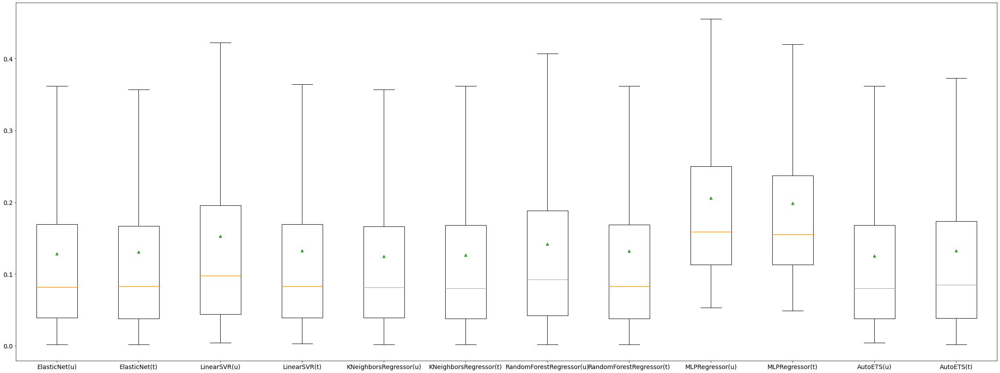

In [26]:
labels = [f'{m}({t[0]})' for m, t in smape_df.columns]

plt.boxplot(smape_df, showfliers=False, labels=labels,showmeans=True)

In [12]:
def ranking():
    ranking = dict()
    frac_best  =  dict()
    for data in datas:
        for key in ['untransformed', 'transformed']:
            tmp_rank = []
            for model_name, model_val in data[key].items():
                if model_name not in ranking:
                    ranking[model_name] = dict()
                    frac_best[model_name] = dict()
                if key not in frac_best[model_name]:
                    ranking[model_name][key] = 0
                    frac_best[model_name][key] = 0
                tmp_rank.append((model_name, model_val['symmetric_mean_absolute_percentage_error']))
            rank = sorted(tmp_rank, key=lambda x: x[1])


            for rank_idx in range(len(rank)):
                model_name, _ = rank[rank_idx]
                ranking[model_name][key] += (rank_idx + 1)
                if rank_idx == 0:
                    frac_best[model_name][key] += 1

    df = pd.DataFrame.from_dict(ranking) / len(datas)
    frac_df = pd.DataFrame.from_dict(frac_best) / len(datas) * 100
    df.loc['mean'] = df.mean()
    frac_df.loc['mean'] = frac_df.mean()
    df.index = pd.MultiIndex.from_product([['RANK'], df.index])
    frac_df.index = pd.MultiIndex.from_product([['FRAC-BEST(%)'], frac_df.index])
    return pd.concat([df, frac_df], axis=0)

rf_df = ranking()

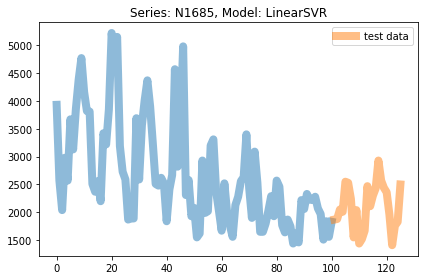

In [13]:
plot_prediction(datas, model='LinearSVR',only_test=False)

In [14]:
plot_prediction(datas, model='LSTM')

In [15]:
smape_df

ElasticNet                 LinearSVR             KNeighborsRegressor  \
      untransformed transformed untransformed transformed       untransformed   
N1679         0.375       0.380         0.440       0.388               0.374   
N1680         0.399       0.376         0.447       0.376               0.356   
N1681         0.334       0.329         0.398       0.334               0.310   
N1682         0.108       0.109         0.136       0.108               0.105   
N1683         0.155       0.145         0.161       0.140               0.133   
...             ...         ...           ...         ...                 ...   
N2775         0.042       0.040         0.044       0.042               0.046   
N2776         0.017       0.017         0.018       0.018               0.017   
N2777         0.023       0.023         0.023       0.023               0.023   
N2780         0.198       0.181         0.304       0.180               0.240   
N2783         0.297       0.301         0.408       0.300               0.286   

                  RandomForestRegressor              MLPRegressor              \
      transformed         untransformed transformed untransformed transformed   
N1679       0.380                 0.435       0.371         0.418       0.435   
N1680       0.356                 0.442       0.382         0.550       0.399   
N1681       0.317                 0.369       0.317         0.398       0.408   
N1682       0.106                 0.138       0.119         0.236       0.223   
N1683       0.130                 0.151       0.133         0.166       0.232   
...           ...                   ...         ...           ...         ...   
N2775       0.044                 0.044       0.041         0.127       0.155   
N2776       0.017                 0.017       0.017         0.155       0.084   
N2777       0.023                 0.023       0.023         0.086       0.083   
N2780       0.181                 0.236       0.184         0.276       0.270   
N2783       0.306                 0.410       0.312         0.383       0.387   

            AutoETS              
      untransformed transformed  
N1679         0.334       0.401  
N1680         0.381       0.395  
N1681         0.326       0.341  
N1682         0.109       0.119  
N1683         0.132       0.154  
...             ...         ...  
N2775         0.042       0.041  
N2776         0.017       0.017  
N2777         0.023       0.023  
N2780         0.196       0.180  
N2783         0.278       0.309  

[1043 rows x 12 columns]

In [16]:
smape_summary

ElasticNet                 LinearSVR              \
           untransformed transformed untransformed transformed   
SMAPE MEAN       0.12835    0.130709      0.152839     0.13236   
Total          133.86900  136.330000    159.411000   138.05200   

           KNeighborsRegressor             RandomForestRegressor              \
                 untransformed transformed         untransformed transformed   
SMAPE MEAN            0.124642    0.126401              0.141693    0.132244   
Total               130.002000  131.836000            147.786000  137.930000   

            MLPRegressor                   AutoETS              
           untransformed transformed untransformed transformed  
SMAPE MEAN      0.205924    0.198616      0.125476    0.132412  
Total         214.779000  207.156000    130.871000  138.106000

In [17]:
from pandas import read_excel
m3_data = read_excel('./Dataset/M3C.xls',sheet_name='M3Month')
m3_data.set_index(["Series"], inplace=True)
m3_info = pd.DataFrame(m3_data.loc[:,'Category'])

In [18]:
a = pd.concat([smape_df,m3_info],axis=1)
a.dropna(how='any',inplace=True)
a

,"(ElasticNet, untransformed)","(ElasticNet, transformed)","(LinearSVR, untransformed)","(LinearSVR, transformed)","(KNeighborsRegressor, untransformed)","(KNeighborsRegressor, transformed)","(RandomForestRegressor, untransformed)","(RandomForestRegressor, transformed)","(MLPRegressor, untransformed)","(MLPRegressor, transformed)","(AutoETS, untransformed)","(AutoETS, transformed)",Category
N1679,0.375,0.380,0.440,0.388,0.374,0.380,0.435,0.371,0.418,0.435,0.334,0.401,MICRO
N1680,0.399,0.376,0.447,0.376,0.356,0.356,0.442,0.382,0.550,0.399,0.381,0.395,MICRO
N1681,0.334,0.329,0.398,0.334,0.310,0.317,0.369,0.317,0.398,0.408,0.326,0.341,MICRO
N1682,0.108,0.109,0.136,0.108,0.105,0.106,0.138,0.119,0.236,0.223,0.109,0.119,MICRO
N1683,0.155,0.145,0.161,0.140,0.133,0.130,0.151,0.133,0.166,0.232,0.132,0.154,MICRO
...,...,...,...,...,...,...,...,...,...,...,...,...,...
N2775,0.042,0.040,0.044,0.042,0.046,0.044,0.044,0.041,0.127,0.155,0.042,0.041,DEMOGRAPHIC
N2776,0.017,0.017,0.018,0.018,0.017,0.017,0.017,0.017,0.155,0.084,0.017,0.017,DEMOGRAPHIC
N2777,0.023,0.023,0.023,0.023,0.023,0.023,0.023,0.023,0.086,0.083,0.023,0.023,DEMOGRAPHIC
N2780,0.198,0.181,0.304,0.180,0.240,0.181,0.236,0.184,0.276,0.270,0.196,0.180,OTHER


### Average SMAPE by Different Categories

In [19]:
a.groupby('Category').mean()

,"(ElasticNet, untransformed)","(ElasticNet, transformed)","(LinearSVR, untransformed)","(LinearSVR, transformed)","(KNeighborsRegressor, untransformed)","(KNeighborsRegressor, transformed)","(RandomForestRegressor, untransformed)","(RandomForestRegressor, transformed)","(MLPRegressor, untransformed)","(MLPRegressor, transformed)","(AutoETS, untransformed)","(AutoETS, transformed)"
Category,,,,,,,,,,,,
DEMOGRAPHIC,0.053011,0.053267,0.057567,0.053533,0.052433,0.053978,0.055189,0.053333,0.143633,0.144511,0.054189,0.052011
FINANCE,0.127926,0.142917,0.144620,0.143711,0.121752,0.138074,0.133529,0.143198,0.199099,0.211157,0.120760,0.129364
INDUSTRY,0.148571,0.146198,0.174886,0.148423,0.147495,0.142048,0.164751,0.148312,0.221580,0.205982,0.151943,0.153075
MACRO,0.067167,0.072773,0.072987,0.073377,0.066337,0.071973,0.070127,0.073197,0.144813,0.147547,0.064303,0.068013
MICRO,0.220812,0.219518,0.283685,0.222980,0.208162,0.207563,0.254396,0.223147,0.303919,0.279629,0.208223,0.233020
OTHER,0.247500,0.241000,0.356000,0.240000,0.263000,0.243500,0.323000,0.248000,0.329500,0.328500,0.237000,0.244500


In [20]:
a.groupby('Category').count()


,"(ElasticNet, untransformed)","(ElasticNet, transformed)","(LinearSVR, untransformed)","(LinearSVR, transformed)","(KNeighborsRegressor, untransformed)","(KNeighborsRegressor, transformed)","(RandomForestRegressor, untransformed)","(RandomForestRegressor, transformed)","(MLPRegressor, untransformed)","(MLPRegressor, transformed)","(AutoETS, untransformed)","(AutoETS, transformed)"
Category,,,,,,,,,,,,
DEMOGRAPHIC,90,90,90,90,90,90,90,90,90,90,90,90
FINANCE,121,121,121,121,121,121,121,121,121,121,121,121
INDUSTRY,333,333,333,333,333,333,333,333,333,333,333,333
MACRO,300,300,300,300,300,300,300,300,300,300,300,300
MICRO,197,197,197,197,197,197,197,197,197,197,197,197
OTHER,2,2,2,2,2,2,2,2,2,2,2,2


In [21]:
industry = a[a['Category'].str.contains("INDUSTRY")]
list = (industry[industry.columns[0]]>industry[industry.columns[1]]) & (industry[industry.columns[2]]>industry[industry.columns[3]]) & (industry[industry.columns[4]]>industry[industry.columns[5]]) &(industry[industry.columns[6]]>industry[industry.columns[7]]) & (industry[industry.columns[8]]>industry[industry.columns[9]]) & (industry[industry.columns[10]]>industry[industry.columns[11]])
list_all = industry[list]

In [22]:
list_all.index

Index(['N1900', 'N1905', 'N1906', 'N1911', 'N1918', 'N1935', 'N1937', 'N1940',
       'N1960', 'N1962', 'N1972', 'N1979', 'N1994', 'N1995', 'N2018', 'N2028',
       'N2044', 'N2051', 'N2056', 'N2058', 'N2061', 'N2072', 'N2077', 'N2078',
       'N2082', 'N2085', 'N2088', 'N2089', 'N2091', 'N2101', 'N2103', 'N2105',
       'N2109', 'N2113', 'N2117', 'N2134', 'N2135', 'N2145', 'N2147', 'N2189',
       'N2203', 'N2207'],
      dtype='object')

### SMAPE improve for all models

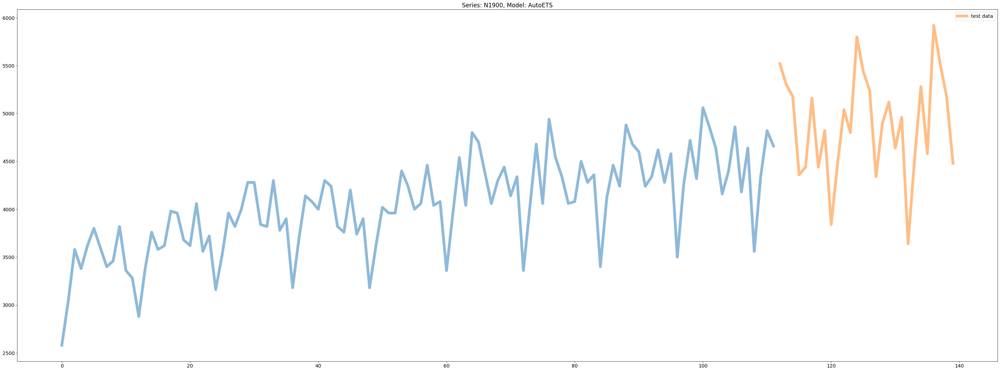

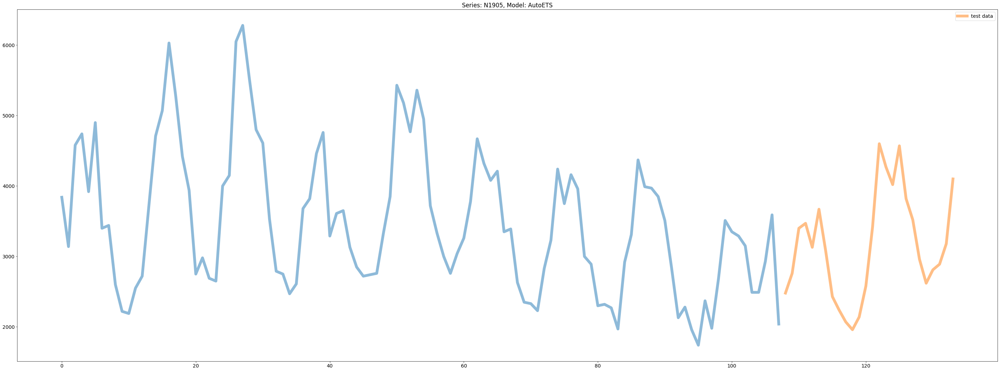

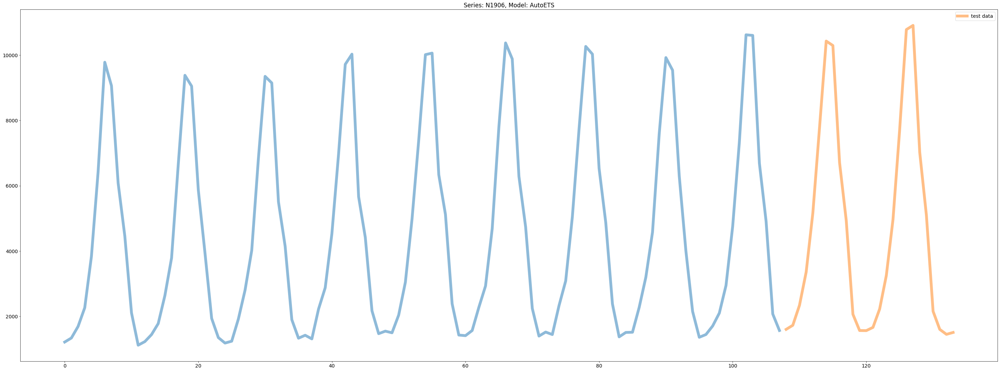

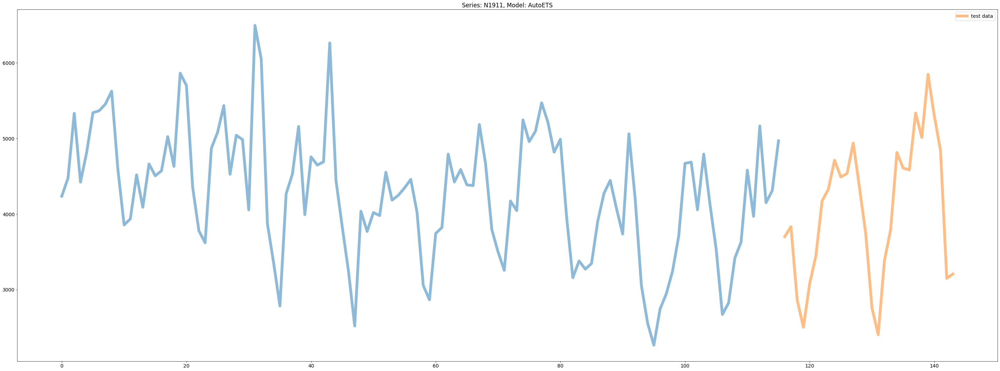

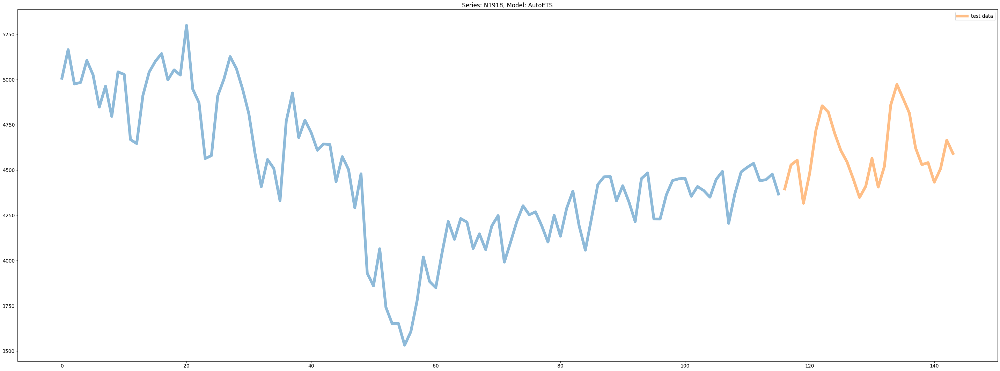

...

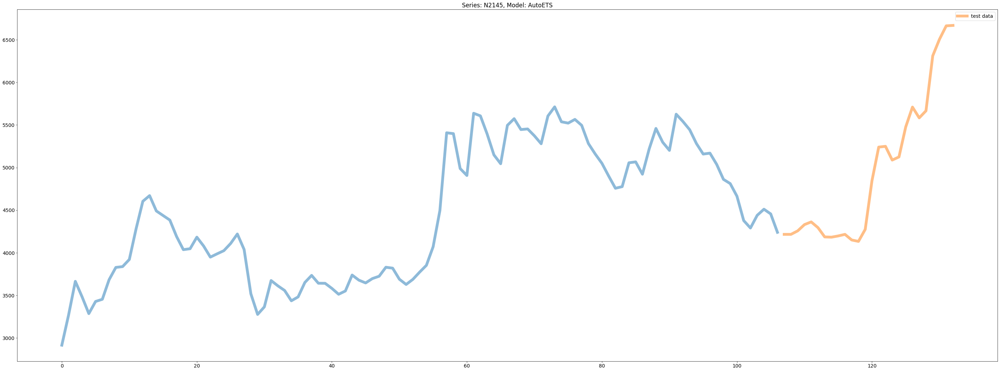

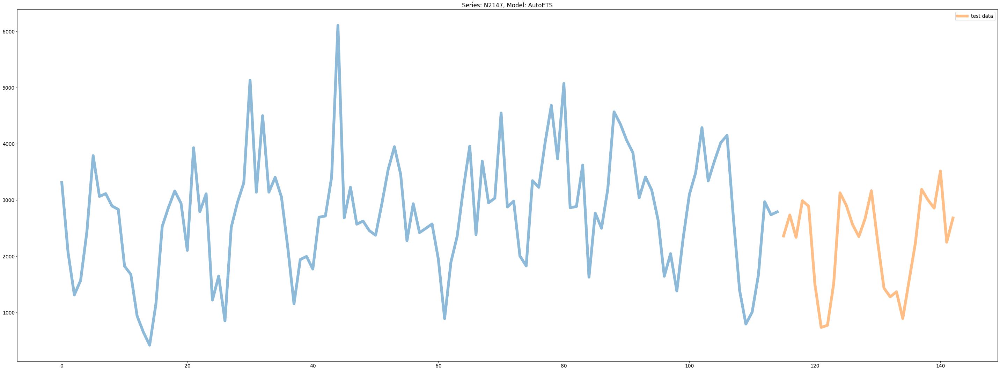

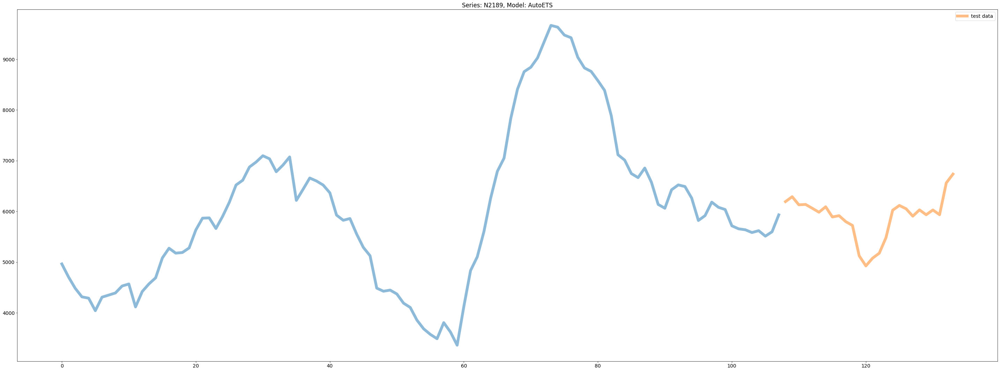

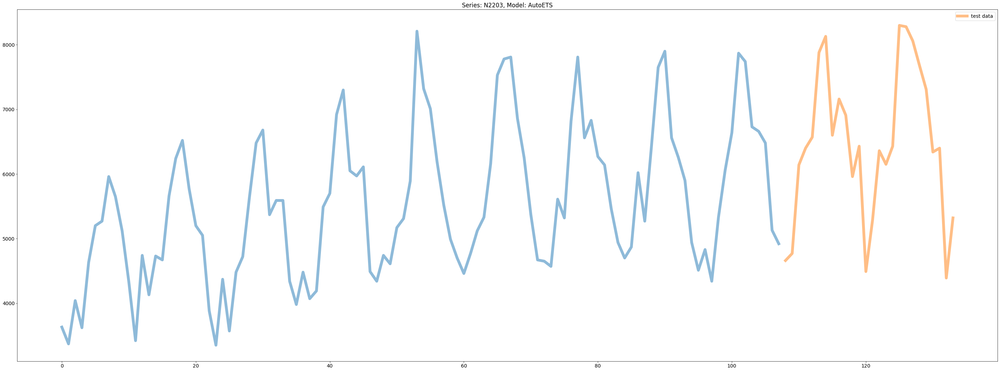

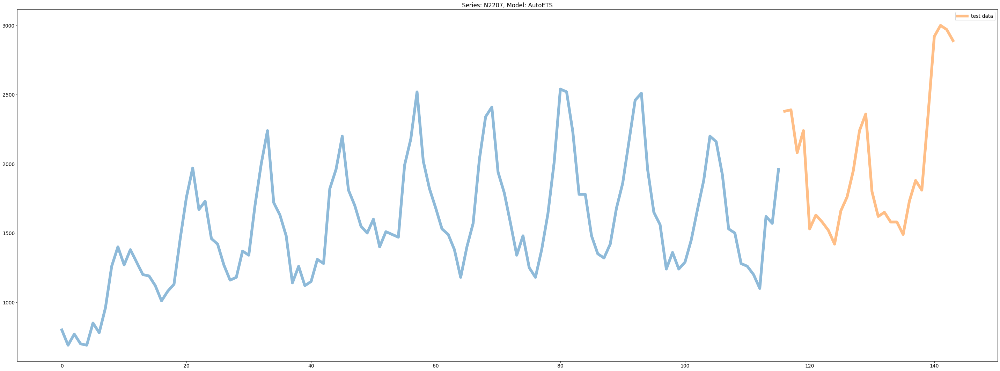

In [ ]:
for data in datas:
    if data['name'] in list_all.index:
        plot_prediction(datas,dataset_name=data['name'],model='AutoETS',only_test=False)

In [ ]:
ElasticNet = pd.DataFrame()
for data in datas:
    ElasticNet[data['name']] = data['untransformed']['ElasticNet']['prediction']
    print(ElasticNet)

          N1680
0   2019.600156
1   1941.748973
2   1865.146904
3   1982.168101
4   1943.771879
5   2200.175998
6   2314.304577
7   2423.642879
8   2002.105492
9   1518.671784
10  1185.692006
11  1005.466701
12  1332.664746
13  2006.407380
14  2377.197538
15  2827.960525
16  2646.531706
17  2209.542056
18  1842.031856
19  1289.963727
20  1235.444562
21  1250.120417
22  1179.255737
23  1473.415932
24  1659.467344
          N1680        N1685
0   2019.600156  1952.281346
1   1941.748973  1927.136942
2   1865.146904  2174.271746
3   1982.168101  2057.569418
4   1943.771879  2144.060322
5   2200.175998  2068.789317
6   2314.304577  1983.676639
7   2423.642879  1982.660807
8   2002.105492  1783.383690
9   1518.671784  1859.817286
10  1185.692006  1462.002807
11  1005.466701  1623.958155
12  1332.664746  1606.830898
13  2006.407380  2040.385909
14  2377.197538  2004.860273
15  2827.960525  2504.068613
16  2646.531706  2438.336135
17  2209.542056  2359.694334
18  1842.031856  1971.614894
19  

C:\Users\Huiqi Luo\AppData\Local\Temp\ipykernel_8976\293162763.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  ElasticNet[data['name']] = data['untransformed']['ElasticNet']['prediction']
C:\Users\Huiqi Luo\AppData\Local\Temp\ipykernel_8976\293162763.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  ElasticNet[data['name']] = data['untransformed']['ElasticNet']['prediction']
C:\Users\Huiqi Luo\AppData\Local\Temp\ipykernel_8976\293162763.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result o

          N1680        N1685        N1686        N1683        N1684  \
0   2019.600156  1952.281346  3233.716015  3427.789843  4086.442015   
1   1941.748973  1927.136942  2796.046530  3622.078545  3889.587777   
2   1865.146904  2174.271746  3195.250904  4066.547196  4108.831042   
3   1982.168101  2057.569418  3435.210890  4434.734356  4415.887445   
4   1943.771879  2144.060322  3224.520976  4331.210502  4392.128196   
5   2200.175998  2068.789317  4224.853237  4380.563264  4406.927018   
6   2314.304577  1983.676639  4288.579806  4097.620639  4295.769301   
7   2423.642879  1982.660807  3654.066991  3967.594445  4115.326073   
8   2002.105492  1783.383690  2992.183783  3572.760902  3683.832609   
9   1518.671784  1859.817286  2912.013892  3385.938099  3936.862094   
10  1185.692006  1462.002807  2348.343349  3215.701131  3745.120050   
11  1005.466701  1623.958155  2435.566869  3233.846578  3894.000971   
12  1332.664746  1606.830898  3126.319995  3492.975391  4063.978261   
13  20

C:\Users\Huiqi Luo\AppData\Local\Temp\ipykernel_8976\293162763.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  ElasticNet[data['name']] = data['untransformed']['ElasticNet']['prediction']
C:\Users\Huiqi Luo\AppData\Local\Temp\ipykernel_8976\293162763.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  ElasticNet[data['name']] = data['untransformed']['ElasticNet']['prediction']
C:\Users\Huiqi Luo\AppData\Local\Temp\ipykernel_8976\293162763.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result o

          N1680        N1685        N1686        N1683        N1684  \
0   2019.600156  1952.281346  3233.716015  3427.789843  4086.442015   
1   1941.748973  1927.136942  2796.046530  3622.078545  3889.587777   
2   1865.146904  2174.271746  3195.250904  4066.547196  4108.831042   
3   1982.168101  2057.569418  3435.210890  4434.734356  4415.887445   
4   1943.771879  2144.060322  3224.520976  4331.210502  4392.128196   
5   2200.175998  2068.789317  4224.853237  4380.563264  4406.927018   
6   2314.304577  1983.676639  4288.579806  4097.620639  4295.769301   
7   2423.642879  1982.660807  3654.066991  3967.594445  4115.326073   
8   2002.105492  1783.383690  2992.183783  3572.760902  3683.832609   
9   1518.671784  1859.817286  2912.013892  3385.938099  3936.862094   
10  1185.692006  1462.002807  2348.343349  3215.701131  3745.120050   
11  1005.466701  1623.958155  2435.566869  3233.846578  3894.000971   
12  1332.664746  1606.830898  3126.319995  3492.975391  4063.978261   
13  20

C:\Users\Huiqi Luo\AppData\Local\Temp\ipykernel_8976\293162763.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  ElasticNet[data['name']] = data['untransformed']['ElasticNet']['prediction']
C:\Users\Huiqi Luo\AppData\Local\Temp\ipykernel_8976\293162763.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  ElasticNet[data['name']] = data['untransformed']['ElasticNet']['prediction']
C:\Users\Huiqi Luo\AppData\Local\Temp\ipykernel_8976\293162763.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result o


          N1680        N1685        N1686        N1683        N1684  \
0   2019.600156  1952.281346  3233.716015  3427.789843  4086.442015   
1   1941.748973  1927.136942  2796.046530  3622.078545  3889.587777   
2   1865.146904  2174.271746  3195.250904  4066.547196  4108.831042   
3   1982.168101  2057.569418  3435.210890  4434.734356  4415.887445   
4   1943.771879  2144.060322  3224.520976  4331.210502  4392.128196   
5   2200.175998  2068.789317  4224.853237  4380.563264  4406.927018   
6   2314.304577  1983.676639  4288.579806  4097.620639  4295.769301   
7   2423.642879  1982.660807  3654.066991  3967.594445  4115.326073   
8   2002.105492  1783.383690  2992.183783  3572.760902  3683.832609   
9   1518.671784  1859.817286  2912.013892  3385.938099  3936.862094   
10  1185.692006  1462.002807  2348.343349  3215.701131  3745.120050   
11  1005.466701  1623.958155  2435.566869  3233.846578  3894.000971   
12  1332.664746  1606.830898  3126.319995  3492.975391  4063.978261   
13  2

C:\Users\Huiqi Luo\AppData\Local\Temp\ipykernel_8976\293162763.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  ElasticNet[data['name']] = data['untransformed']['ElasticNet']['prediction']
C:\Users\Huiqi Luo\AppData\Local\Temp\ipykernel_8976\293162763.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  ElasticNet[data['name']] = data['untransformed']['ElasticNet']['prediction']
C:\Users\Huiqi Luo\AppData\Local\Temp\ipykernel_8976\293162763.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result o

          N1680        N1685        N1686        N1683        N1684  \
0   2019.600156  1952.281346  3233.716015  3427.789843  4086.442015   
1   1941.748973  1927.136942  2796.046530  3622.078545  3889.587777   
2   1865.146904  2174.271746  3195.250904  4066.547196  4108.831042   
3   1982.168101  2057.569418  3435.210890  4434.734356  4415.887445   
4   1943.771879  2144.060322  3224.520976  4331.210502  4392.128196   
5   2200.175998  2068.789317  4224.853237  4380.563264  4406.927018   
6   2314.304577  1983.676639  4288.579806  4097.620639  4295.769301   
7   2423.642879  1982.660807  3654.066991  3967.594445  4115.326073   
8   2002.105492  1783.383690  2992.183783  3572.760902  3683.832609   
9   1518.671784  1859.817286  2912.013892  3385.938099  3936.862094   
10  1185.692006  1462.002807  2348.343349  3215.701131  3745.120050   
11  1005.466701  1623.958155  2435.566869  3233.846578  3894.000971   
12  1332.664746  1606.830898  3126.319995  3492.975391  4063.978261   
13  20

C:\Users\Huiqi Luo\AppData\Local\Temp\ipykernel_8976\293162763.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  ElasticNet[data['name']] = data['untransformed']['ElasticNet']['prediction']
C:\Users\Huiqi Luo\AppData\Local\Temp\ipykernel_8976\293162763.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  ElasticNet[data['name']] = data['untransformed']['ElasticNet']['prediction']
C:\Users\Huiqi Luo\AppData\Local\Temp\ipykernel_8976\293162763.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result o


          N1680        N1685        N1686        N1683        N1684  \
0   2019.600156  1952.281346  3233.716015  3427.789843  4086.442015   
1   1941.748973  1927.136942  2796.046530  3622.078545  3889.587777   
2   1865.146904  2174.271746  3195.250904  4066.547196  4108.831042   
3   1982.168101  2057.569418  3435.210890  4434.734356  4415.887445   
4   1943.771879  2144.060322  3224.520976  4331.210502  4392.128196   
5   2200.175998  2068.789317  4224.853237  4380.563264  4406.927018   
6   2314.304577  1983.676639  4288.579806  4097.620639  4295.769301   
7   2423.642879  1982.660807  3654.066991  3967.594445  4115.326073   
8   2002.105492  1783.383690  2992.183783  3572.760902  3683.832609   
9   1518.671784  1859.817286  2912.013892  3385.938099  3936.862094   
10  1185.692006  1462.002807  2348.343349  3215.701131  3745.120050   
11  1005.466701  1623.958155  2435.566869  3233.846578  3894.000971   
12  1332.664746  1606.830898  3126.319995  3492.975391  4063.978261   
13  2

C:\Users\Huiqi Luo\AppData\Local\Temp\ipykernel_8976\293162763.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  ElasticNet[data['name']] = data['untransformed']['ElasticNet']['prediction']
C:\Users\Huiqi Luo\AppData\Local\Temp\ipykernel_8976\293162763.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  ElasticNet[data['name']] = data['untransformed']['ElasticNet']['prediction']
C:\Users\Huiqi Luo\AppData\Local\Temp\ipykernel_8976\293162763.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result o


          N1680        N1685        N1686        N1683        N1684  \
0   2019.600156  1952.281346  3233.716015  3427.789843  4086.442015   
1   1941.748973  1927.136942  2796.046530  3622.078545  3889.587777   
2   1865.146904  2174.271746  3195.250904  4066.547196  4108.831042   
3   1982.168101  2057.569418  3435.210890  4434.734356  4415.887445   
4   1943.771879  2144.060322  3224.520976  4331.210502  4392.128196   
5   2200.175998  2068.789317  4224.853237  4380.563264  4406.927018   
6   2314.304577  1983.676639  4288.579806  4097.620639  4295.769301   
7   2423.642879  1982.660807  3654.066991  3967.594445  4115.326073   
8   2002.105492  1783.383690  2992.183783  3572.760902  3683.832609   
9   1518.671784  1859.817286  2912.013892  3385.938099  3936.862094   
10  1185.692006  1462.002807  2348.343349  3215.701131  3745.120050   
11  1005.466701  1623.958155  2435.566869  3233.846578  3894.000971   
12  1332.664746  1606.830898  3126.319995  3492.975391  4063.978261   
13  2

C:\Users\Huiqi Luo\AppData\Local\Temp\ipykernel_8976\293162763.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  ElasticNet[data['name']] = data['untransformed']['ElasticNet']['prediction']
C:\Users\Huiqi Luo\AppData\Local\Temp\ipykernel_8976\293162763.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  ElasticNet[data['name']] = data['untransformed']['ElasticNet']['prediction']
C:\Users\Huiqi Luo\AppData\Local\Temp\ipykernel_8976\293162763.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result o

ValueError: Length of values (28) does not match length of index (25)

In [ ]:
datas

AttributeError: 'list' object has no attribute 'key'